In [120]:
# It is mainly used for data processing, visualization, modeling, scoring, etc
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', 32)

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
import plotly.express as px
%matplotlib inline

# Missing value visualization
import missingno as msno
# Map visualization
import folium
from folium.plugins import HeatMap

# Modeling correlation
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, recall_score, roc_auc_score, precision_score, f1_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

# Ignore warning
import warnings
warnings.filterwarnings('ignore')

In [121]:
df=pd.read_csv('hotel_bookings.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [122]:
# 1. Check Variable

df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [123]:
# 2. Total number of columns
len(df.columns)

32

In [124]:
# 3. Data type
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [125]:
# 4, Different types of data statistics
df.dtypes.value_counts()

int64      16
object     12
float64     4
Name: count, dtype: int64

In [126]:
# 5. Data shape
df.shape

(119390, 32)

In [127]:
# 6. Describe statistics of data
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [128]:
# 7, Data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

### Missing value information

#### Statistics of missing values in each field

Count the number and proportion of missing values in each field

In [129]:
null_df = pd.DataFrame({"Null Values": df.isnull().sum(),
                         "Percentage Null Values": (df.isnull().sum()) / (df.shape[0]) * 100
                         })

null_df

,Null Values,Percentage Null Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


### Missing value visualization
#### Visual display of missing value information:

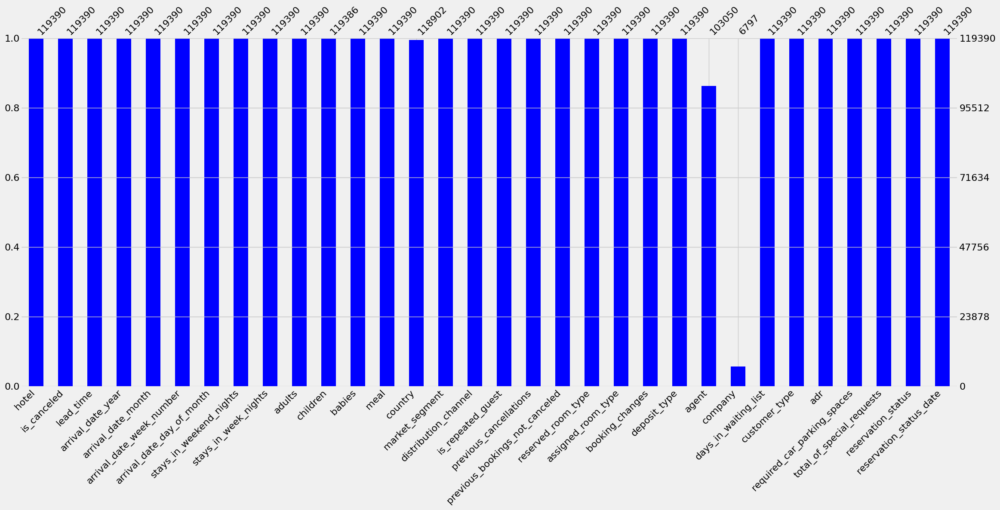

In [130]:
msno.bar(df, color="blue")

plt.show()

Missing value processing

1、The proportion of missing value of field children and field country is less than 1%, the proportion is very small; We just delete the missing values

In [131]:
# Filter out data with non-missing values

df = df[df["country"].isnull() == False]
df = df[df["children"].isnull() == False]

df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


2、The proportion of missing value of field company is as high as 94.3%, so we consider deleting this field directly:

In [132]:
df.drop("company", axis=1, inplace=True)

3、The missing value of the field agent(Agent fee) is 13.68%, which is processed as:

In [133]:
# 1. Check the field information first
df["agent"].value_counts()

agent
9.0      31959
240.0    13871
1.0       7191
14.0      3638
7.0       3539
         ...  
70.0         1
93.0         1
54.0         1
497.0        1
59.0         1
Name: count, Length: 332, dtype: int64

We can consider using values to fill, such as:

0: The specific data for which the missing value cannot be determined

9: Mode

Mean: The mean of the existing values in the field

Here we consider using 0 for padding:

In [134]:
df["agent"].fillna(0,inplace=True)

### Special processing

Processing 1: The number of guests cannot be 0

Consider that the number of adults, children, and babies in a room cannot all be 0 at the same time

In [135]:
special = (df["children"] == 0) & (df.adults == 0) & (df.babies == 0)
special.head()

0    False
1    False
2    False
3    False
4    False
dtype: bool

In [136]:
# 排除特殊情况
df = df[~special]

### Processing 2: adr (average daily price)

The value cannot be negative

The maximum value is 5400, which can be judged as an outlier

In [137]:
df["adr"].value_counts().sort_index()

adr
-6.38          1
 0.00       1799
 0.26          1
 0.50          1
 1.00         14
            ... 
 450.00        1
 451.50        1
 508.00        1
 510.00        1
 5400.00       1
Name: count, Length: 8857, dtype: int64

In [138]:
# Look at the distribution of the data through the violin diagram: there are clearly outliers before processing
px.violin(y=df["adr"])   # 处理前

In [139]:
px.box(df,y="adr")

In [140]:
# Delete information larger than 1000 df = df.drop(df[df.AD&gt;1000].index)

df = df[(df["adr"] >= 0) & (df["adr"] < 5400)]  # 排除异常值

In [141]:
px.violin(y=df["adr"])  # afetr delete

In [142]:
px.box(df,y="adr",color="hotel")   # after delete

## EDA-Exploratory Data Analysis
### Number of cancelled and uncancelled customers

In [143]:
df["is_canceled"].value_counts()

is_canceled
0    74589
1    44137
Name: count, dtype: int64

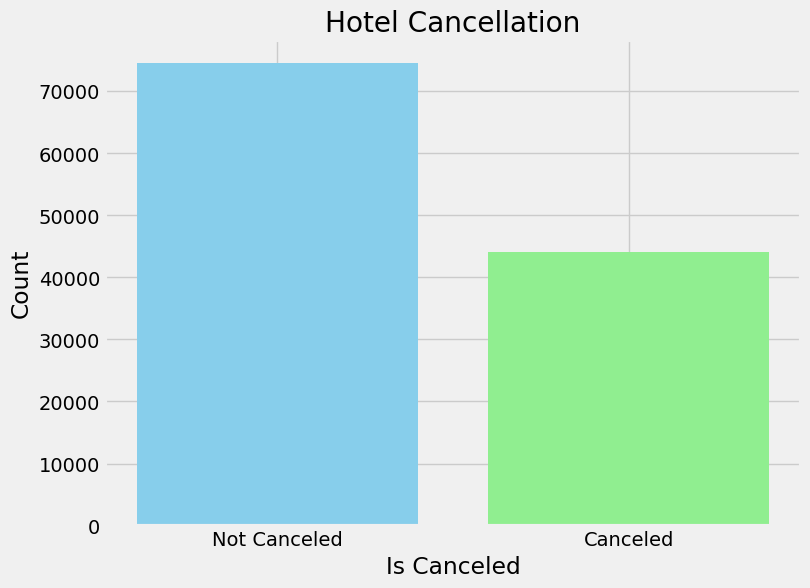

In [144]:
# Calculate the counts of each value in the is_canceled column
counts = df['is_canceled'].value_counts()

# Create a new figure
plt.figure(figsize=(8, 6))

# Create a bar plot of the counts
plt.bar(counts.index, counts.values, color=['skyblue', 'lightgreen'])

# Add labels and title
plt.xlabel('Is Canceled')
plt.ylabel('Count')
plt.title('Hotel Cancellation')
plt.xticks([0, 1], ['Not Canceled', 'Canceled'])

# Display the plot
plt.show()

In [145]:
# Where do uncancelled customers come from?
data = df[df.is_canceled == 0]  # Uncancelled data

In [146]:
number_no_canceled = data["country"].value_counts().reset_index()
number_no_canceled.columns = ["country", "number_of_no_canceled"]

number_no_canceled

,country,number_of_no_canceled
0,PRT,20977
1,GBR,9667
2,FRA,8468
3,ESP,6383
4,DEU,6067
...,...,...
160,BHR,1
161,DJI,1
162,MLI,1
163,NPL,1


In [147]:
# Map visualization

basemap = folium.Map()
guests_map = px.choropleth(number_no_canceled, # 传入数据
                           locations = number_no_canceled['country'],  # 地理位置
                           color = number_no_canceled['number_of_no_canceled'],  # 颜色取值
                           hover_name = number_no_canceled['country'])  # 悬停信息
guests_map.show()

### Conclusion 1: The customers who made the reservation were mainly from Portugal, mostly from European countries

In [148]:
# What is the average daily rate for the room?

px.box(data,  # data
       x="reserved_room_type",  # x
       y="adr", # y
       color="hotel",  # color
       template="plotly_dark",  # theme
       category_orders={"reserved_room_type":["A","B","C","D","E","F","G","H","L"]} # 指定排列顺序
      )

### # Conclusion 2: The average price of each room still depends on its type and standard deviation

What's the rate per night all year round?

Average price change for two different types of hotels throughout the year

In [149]:
data_resort = data[data["hotel"] == "Resort Hotel"]
data_city = data[data["hotel"] == "City Hotel"]

In [150]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel = data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,111.962267
1,August,118.674598
2,December,88.401855
3,February,86.520062
4,January,82.330983
5,July,115.818019
6,June,117.874360
7,March,90.658533
8,May,120.669827
9,November,86.946178


In [151]:
# Merge two data

total_hotel = pd.merge(resort_hotel, city_hotel,
                        on="arrival_date_month"
                        )
total_hotel.columns = ["month","price_resort","price_city"]
total_hotel

,month,price_resort,price_city
0,April,76.176140,111.962267
1,August,181.348715,118.674598
2,December,68.634584,88.401855
3,February,54.468180,86.520062
4,January,48.994018,82.330983
5,July,150.483553,115.818019
6,June,108.133154,117.874360
7,March,57.433661,90.658533
8,May,76.734804,120.669827
9,November,48.882907,86.946178


To get the months sorted by normal time, install two packages:

Directly installed: add! before pip

In [152]:
#!pip install sort-dataframeby-monthorweek
#!pip install sorted-months-weekdays

In [153]:
import sort_dataframeby_monthorweek as sd

# Custom sort function
def sort_month(df, column):
    result = sd.Sort_Dataframeby_Month(df,column)
    return result

In [154]:
new_total_hotel = sort_month(total_hotel, "month")
new_total_hotel

,month,price_resort,price_city
0,January,48.994018,82.330983
1,February,54.468180,86.520062
2,March,57.433661,90.658533
3,April,76.176140,111.962267
4,May,76.734804,120.669827
5,June,108.133154,117.874360
6,July,150.483553,115.818019
7,August,181.348715,118.674598
8,September,96.288897,112.776582
9,October,61.932777,102.004672


In [155]:
fig = px.line(new_total_hotel,
        x = "month",
        y = ["price_resort", "price_city"],
        title = "Price of per night over the Months",
        template = "plotly_dark"      
       )

fig.show()

### Conclusion:

The price of Resort Hotel is significantly higher than that of City Hotel in summer

Prices at City hotels have changed less. But City Hotel prices have been high since April and continue through September

### KDE diagram

Kernel Density Estimation (KDE) can be considered as windowing smoothing of histograms. See the distribution of data in different situations through the KDE distribution field

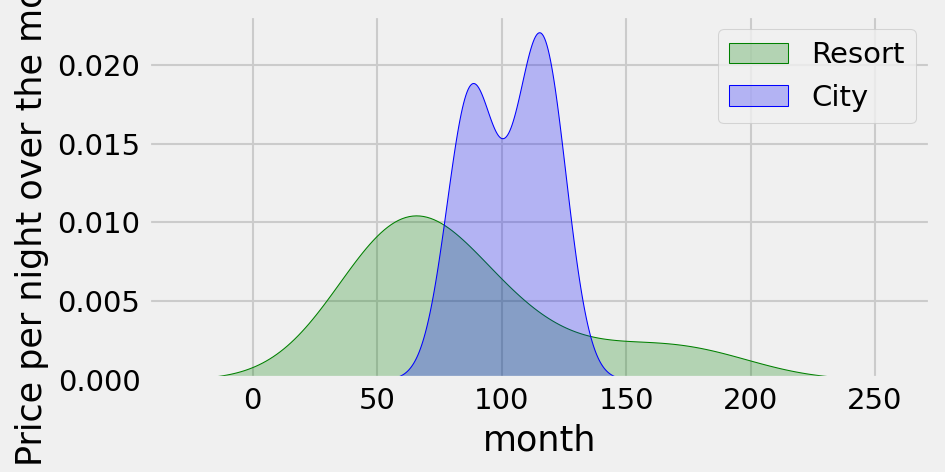

In [156]:
plt.figure(figsize=(6,3), dpi=150)

ax = sns.kdeplot(new_total_hotel["price_resort"], 
                 color="green", 
                 shade=True)

ax = sns.kdeplot(new_total_hotel["price_city"], 
                 color="blue", 
                 shade=True)

ax.set_xlabel("month")
ax.set_ylabel("Price per night over the month")
ax = ax.legend(["Resort","City"])

### The busiest season -the most busy months

In [157]:
resort_guests = data_resort['arrival_date_month'].value_counts().reset_index()
resort_guests.columns=['Month','No_Resort_Guests']

city_guests = data_city['arrival_date_month'].value_counts().reset_index()
city_guests.columns=['Month','No_City_Guests']

# Merge two dataframes
final_guests = pd.merge(resort_guests, city_guests)

In [158]:
# Also sort the months
new_final_guests = sort_month(final_guests, "Month")
new_final_guests

,Month,No_Resort_Guests,No_City_Guests
0,January,1812,2249
1,February,2253,3051
2,March,2516,4049
3,April,2518,4010
4,May,2523,4568
5,June,2026,4358
6,July,3110,4770
7,August,3237,5367
8,September,2077,4283
9,October,2528,4326


In [159]:
fig = px.line(new_final_guests,
        x = "Month",
        y = ["No_Resort_Guests", "No_City_Guests"],
        title = "No of per Month",
        template = "plotly_dark"      
       )

fig.show()

### Conclusion:

It is obvious that City Hotel is more popular than Resort Hotel

City Hotel also saw peak numbers in July-August, despite high prices (above)

Both hotels have few customers in winter

### How long do customers stay?

In [160]:
data["total_nights"] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_nights
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.0,0,1,Check-Out,2015-07-03,2


In [161]:
# Statistics for two different hotels with different stay times:

stay_groupby = (data.groupby(['total_nights', 'hotel'])["is_canceled"]
                .agg("count")
                .reset_index()
                .rename(columns={"is_canceled":"Number of stays"}))

stay_groupby.head()

,total_nights,hotel,Number of stays
0,0,City Hotel,251
1,0,Resort Hotel,366
2,1,City Hotel,9155
3,1,Resort Hotel,6368
4,2,City Hotel,10983


In [162]:
stay_groupby = (data.groupby(['total_nights', 'hotel'])["is_canceled"]
                .agg("count")
                .reset_index()
                .rename(columns={"is_canceled":"Number of stays"}))

stay_groupby.head()

,total_nights,hotel,Number of stays
0,0,City Hotel,251
1,0,Resort Hotel,366
2,1,City Hotel,9155
3,1,Resort Hotel,6368
4,2,City Hotel,10983


In [163]:
fig = px.bar(stay_groupby,
       x = "total_nights",
       y = "Number of stays",
       color = "hotel",
       barmode = "group"
      )

fig.show()

### Data Pre Processing
### Relevance judgment

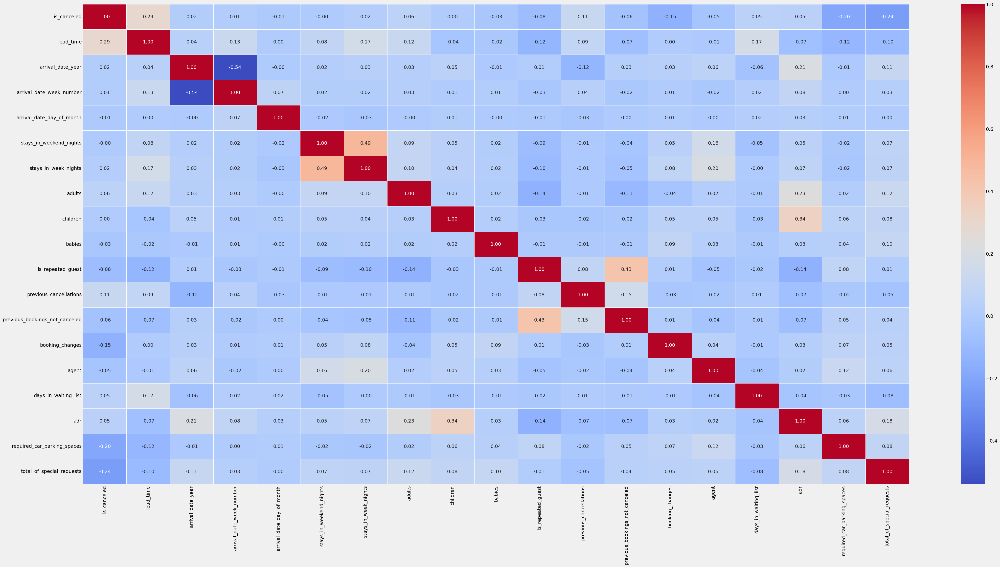

In [164]:
# Select only numeric columns
numeric_data = df.select_dtypes(include=[np.number])

# Calculate correlation
corr = numeric_data.corr()

# Create a larger figure
plt.figure(figsize=(48, 24))

# Plot heatmap
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, linewidths=0.5)

plt.show()

In [165]:
# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate correlation
corr_with_iscanceled = numeric_df.corr()["is_canceled"].abs().sort_values(ascending=False)

print(corr_with_iscanceled)

is_canceled                       1.000000
lead_time                         0.291619
total_of_special_requests         0.235923
required_car_parking_spaces       0.195013
booking_changes                   0.145139
previous_cancellations            0.109911
is_repeated_guest                 0.084115
adults                            0.056129
previous_bookings_not_canceled    0.055494
days_in_waiting_list              0.054114
agent                             0.046842
adr                               0.045910
babies                            0.032605
stays_in_week_nights              0.024825
arrival_date_year                 0.016419
arrival_date_week_number          0.007668
arrival_date_day_of_month         0.006022
children                          0.004536
stays_in_weekend_nights           0.002192
Name: is_canceled, dtype: float64


In [166]:
# Delete invalid fields
no_use_col = ['arrival_date_year', 'assigned_room_type',
             'booking_changes','reservation_status', 
             'country', 'days_in_waiting_list']

In [167]:
df.drop(no_use_col, axis=1, inplace=True)

### 特征工程

离散型变量处理

In [168]:
df["hotel"].dtype # Series Indicates the variable type of the data

dtype('O')

In [169]:
cat_cols = [col for col in df.columns if df[col].dtype == "O"]
cat_cols

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status_date']

In [170]:
cat_df = df[cat_cols]

In [171]:
cat_df.dtypes

hotel                      object
arrival_date_month         object
meal                       object
market_segment             object
distribution_channel       object
reserved_room_type         object
deposit_type               object
customer_type              object
reservation_status_date    object
dtype: object

In [172]:
# 1. Convert to time type data

cat_df['reservation_status_date'] = pd.to_datetime(cat_df['reservation_status_date'])

In [173]:
# 2, extraction year, month and date

cat_df["year"] = cat_df['reservation_status_date'].dt.year
cat_df['month'] = cat_df['reservation_status_date'].dt.month
cat_df['day'] = cat_df['reservation_status_date'].dt.day

In [174]:
# 3. Delete invalid fields
cat_df.drop(['reservation_status_date','arrival_date_month'], axis=1, inplace=True)

In [175]:
# 4. Unique value for each field

for col in cat_df.columns:
    print(f"{col}: \n{cat_df[col].unique()}\n")


hotel: 
['Resort Hotel' 'City Hotel']

meal: 
['BB' 'FB' 'HB' 'SC' 'Undefined']

market_segment: 
['Direct' 'Corporate' 'Online TA' 'Offline TA/TO' 'Complementary' 'Groups'
 'Aviation']

distribution_channel: 
['Direct' 'Corporate' 'TA/TO' 'Undefined' 'GDS']

reserved_room_type: 
['C' 'A' 'D' 'E' 'G' 'F' 'H' 'L' 'B']

deposit_type: 
['No Deposit' 'Refundable' 'Non Refund']

customer_type: 
['Transient' 'Contract' 'Transient-Party' 'Group']

year: 
[2015 2014 2016 2017]

month: 
[ 7  5  4  6  3  8  9  1 11 10 12  2]

day: 
[ 1  2  3  6 22 23  5  7  8 11 16 29 19 18  9 13  4 12 26 17 15 10 20 14
 30 28 25 21 27 24 31]



### 特征编码

In [176]:
# Hotel
cat_df['hotel'] = cat_df['hotel'].map({'Resort Hotel' : 0, 
                                       'City Hotel' : 1})
# Meals
cat_df['meal'] = cat_df['meal'].map({'BB' : 0, 
                                     'FB': 1, 
                                     'HB': 2, 
                                     'SC': 3, 
                                     'Undefined': 4})
# Market segmentation
cat_df['market_segment'] = (cat_df['market_segment']
                            .map({'Direct': 0,
                                 'Corporate':1,
                                 'Online TA':2, 
                                 'Offline TA/TO': 3,
                                 'Complementary': 4,
                                 'Groups': 5,
                                 'Undefined': 6,
                                 'Aviation': 7}))
# Distribution Channels
cat_df['distribution_channel'] = (cat_df['distribution_channel']
                                  .map({'Direct': 0,
                                        'Corporate': 1,
                                        'TA/TO': 2, 
                                        'Undefined': 3,
                                        'GDS': 4}))
# 预订房间类型
cat_df['reserved_room_type'] = (cat_df['reserved_room_type']
                                .map({'C': 0, 
                                      'A': 1, 
                                      'D': 2, 
                                      'E': 3, 
                                      'G': 4, 
                                      'F': 5, 
                                      'H': 6,
                                      'L': 7, 
                                      'B': 8}))
# Deposit method
cat_df['deposit_type'] = (cat_df['deposit_type']
                          .map({'No Deposit': 0, 
                                'Refundable': 1, 
                                'Non Refund': 3}))
# Customer Type
cat_df['customer_type'] = (cat_df['customer_type']
                           .map({'Transient': 0, 
                                 'Contract': 1, 
                                 'Transient-Party': 2, 
                                 'Group': 3})
                          )
# Year
cat_df['year'] = cat_df['year'].map({2015: 0, 2014: 1, 2016: 2, 2017: 3})

### Continuous variable handling

In [177]:
num_df = df.drop(columns=cat_cols,axis=1)

num_df.drop("is_canceled",axis=1,inplace=True)

In [178]:
# The fields with large variance are processed logarithmically
log_col = ["lead_time","arrival_date_week_number","arrival_date_day_of_month","agent","adr"]

for col in log_col:
    num_df[col] = np.log(num_df[col] + 1)
    
num_df.head()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,adr,required_car_parking_spaces,total_of_special_requests
0,5.837730,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.000000,0,0
1,6.603944,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.000000,0,0
2,2.079442,3.332205,0.693147,0,1,1,0.0,0,0,0,0,0.000000,4.330733,0,0
3,2.639057,3.332205,0.693147,0,1,1,0.0,0,0,0,0,5.720312,4.330733,0,0
4,2.708050,3.332205,0.693147,0,2,2,0.0,0,0,0,0,5.484797,4.595120,0,1


### Build Model
### Merge two dataframe

In [179]:
X = pd.concat([cat_df, num_df], axis=1)
y = df["is_canceled"]

In [180]:
print(X.shape)
print(y.shape)

(118726, 25)
(118726,)


In [181]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,random_state=412)

### Modeling 1: Logistic regression

In [182]:
# Model instantiation
lr = LogisticRegression()
lr.fit(X_train, y_train)

# Predicted value
y_pred_lr = lr.predict(X_test)

# Different evaluation indicators for classification problems
acc_lr = accuracy_score(y_test, y_pred_lr)
conf = confusion_matrix(y_test, y_pred_lr)
clf_report = classification_report(y_test, y_pred_lr)

print(f"Accuracy Score of Logistic Regression is : {acc_lr}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Logistic Regression is : 0.8128105786237683
Confusion Matrix : 
[[14183   786]
 [ 3659  5118]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.79      0.95      0.86     14969
           1       0.87      0.58      0.70      8777

    accuracy                           0.81     23746
   macro avg       0.83      0.77      0.78     23746
weighted avg       0.82      0.81      0.80     23746



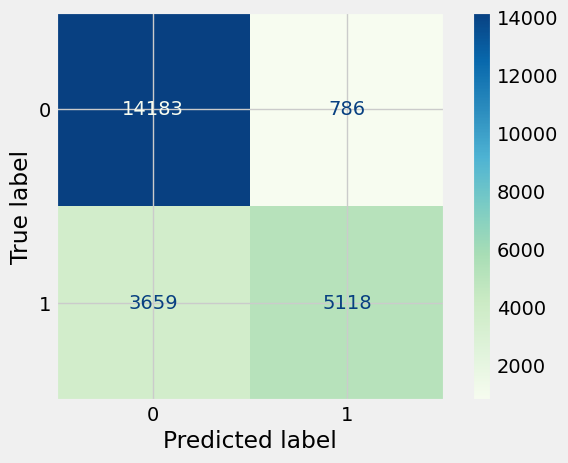

In [183]:
#Confusion matrix visualization

classes = ["0","1"]

disp = ConfusionMatrixDisplay(confusion_matrix=conf, display_labels=classes)
disp.plot(
    include_values=True,            # Confusion Matrix displays specific values on each cell
    cmap="GnBu",                 # matplotlib identifies color maps
    ax=None,
    xticks_rotation="horizontal",
    values_format="d"
)

plt.show()

In [185]:
#KNN model
knn = KNeighborsClassifier()
knn.fit(X_train.values, y_train.values)

y_pred= knn.predict(X_test.values)

acc_knn = accuracy_score(y_test.values, y_pred)
conf = confusion_matrix(y_test.values, y_pred)
clf_report = classification_report(y_test.values, y_pred)

In [186]:
#Model 3: Decision tree model
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

y_pred_dtc = dtc.predict(X_test)

acc_dtc = accuracy_score(y_test, y_pred_dtc)
conf = confusion_matrix(y_test, y_pred_dtc)
clf_report = classification_report(y_test, y_pred_dtc)

In [187]:
#Model 4: Random Forest
rd_clf = RandomForestClassifier()
rd_clf.fit(X_train, y_train)

y_pred_rd_clf = rd_clf.predict(X_test)

acc_rd_clf = accuracy_score(y_test, y_pred_rd_clf)
conf = confusion_matrix(y_test, y_pred_rd_clf)
clf_report = classification_report(y_test, y_pred_rd_clf)

In [188]:
#Model 5: Adaboost model
ada = AdaBoostClassifier(base_estimator = dtc)
ada.fit(X_train, y_train)

y_pred_ada = ada.predict(X_test)

acc_ada = accuracy_score(y_test, y_pred_ada)
conf = confusion_matrix(y_test, y_pred_ada)
clf_report = classification_report(y_test, y_pred_ada)

In [189]:
#Model 6: Gradient Boosting Classifier
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

y_pred_gb = gb.predict(X_test)

acc_gb = accuracy_score(y_test, y_pred_gb)
conf = confusion_matrix(y_test, y_pred_gb)
clf_report = classification_report(y_test, y_pred_gb)

In [190]:
#Model 7: XGBoost
xgb = XGBClassifier(booster='gbtree', 
                    learning_rate=0.1, 
                    max_depth=5, 
                    n_estimators=180)

xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

acc_xgb = accuracy_score(y_test, y_pred_xgb)
conf = confusion_matrix(y_test, y_pred_xgb)
clf_report = classification_report(y_test, y_pred_xgb)

In [191]:
#Model 8: CatBoost
cat = CatBoostClassifier(iterations=100)
cat.fit(X_train, y_train)

y_pred_cat = cat.predict(X_test)

acc_cat = accuracy_score(y_test, y_pred_cat)
conf = confusion_matrix(y_test, y_pred_cat)
clf_report = classification_report(y_test, y_pred_cat)

Learning rate set to 0.5
0:	learn: 0.4751785	total: 68.2ms	remaining: 6.75s
1:	learn: 0.4103103	total: 75.2ms	remaining: 3.68s
2:	learn: 0.3533169	total: 84.2ms	remaining: 2.72s
3:	learn: 0.3290295	total: 92.7ms	remaining: 2.23s
4:	learn: 0.2719980	total: 101ms	remaining: 1.93s
5:	learn: 0.2492808	total: 110ms	remaining: 1.73s
6:	learn: 0.2152683	total: 119ms	remaining: 1.57s
7:	learn: 0.1919799	total: 127ms	remaining: 1.46s
8:	learn: 0.1776197	total: 136ms	remaining: 1.37s
9:	learn: 0.1654125	total: 144ms	remaining: 1.3s
10:	learn: 0.1555014	total: 153ms	remaining: 1.24s
11:	learn: 0.1452100	total: 161ms	remaining: 1.18s
12:	learn: 0.1381843	total: 170ms	remaining: 1.14s
13:	learn: 0.1327335	total: 178ms	remaining: 1.09s
14:	learn: 0.1276286	total: 187ms	remaining: 1.06s
15:	learn: 0.1220964	total: 195ms	remaining: 1.02s
16:	learn: 0.1148292	total: 205ms	remaining: 999ms
17:	learn: 0.1117525	total: 213ms	remaining: 971ms
18:	learn: 0.1047834	total: 222ms	remaining: 946ms
19:	learn: 0.

In [192]:
#Model 9: Extra Trees Classifier
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

y_pred_etc = etc.predict(X_test)

acc_etc = accuracy_score(y_test, y_pred_etc)
conf = confusion_matrix(y_test, y_pred_etc)
clf_report = classification_report(y_test, y_pred_etc)

In [193]:
#Model 10: LGBM
lgbm = LGBMClassifier(learning_rate = 1)
lgbm.fit(X_train, y_train)

y_pred_lgbm = lgbm.predict(X_test)

acc_lgbm = accuracy_score(y_test, y_pred_lgbm)
conf = confusion_matrix(y_test, y_pred_lgbm)
clf_report = classification_report(y_test, y_pred_lgbm)

[LightGBM] [Info] Number of positive: 35360, number of negative: 59620
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 996
[LightGBM] [Info] Number of data points in the train set: 94980, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.372289 -> initscore=-0.522410
[LightGBM] [Info] Start training from score -0.522410


In [195]:
# Model 11: Voting Classifier -Voting Classifier
# This is key modeling: voting on multiple classifiers

classifiers = [('Gradient Boosting Classifier', gb), 
               ('Cat Boost Classifier', cat), 
               ('XGboost', xgb),  
               ('Decision Tree', dtc),
               ('Extra Tree', etc), 
               ('Light Gradient', lgbm), 
               ('Random Forest', rd_clf), 
               ('Ada Boost', ada), 
               ('Logistic', lr),
               ('Knn', knn)]

vc = VotingClassifier(estimators = classifiers)
vc.fit(X_train.values, y_train.values)

y_pred_vc = vc.predict(X_test.values)

acc_vtc = accuracy_score(y_test.values, y_pred_vc)
conf = confusion_matrix(y_test.values, y_pred_vc)
clf_report = classification_report(y_test.values, y_pred_vc)

Learning rate set to 0.5
0:	learn: 0.4751785	total: 7.75ms	remaining: 767ms
1:	learn: 0.4103103	total: 16.4ms	remaining: 803ms
2:	learn: 0.3533169	total: 25.3ms	remaining: 820ms
3:	learn: 0.3290295	total: 34.1ms	remaining: 819ms
4:	learn: 0.2719980	total: 42.6ms	remaining: 810ms
5:	learn: 0.2492808	total: 50.9ms	remaining: 798ms
6:	learn: 0.2152683	total: 59.4ms	remaining: 789ms
7:	learn: 0.1919799	total: 67.9ms	remaining: 781ms
8:	learn: 0.1776197	total: 76.8ms	remaining: 777ms
9:	learn: 0.1654125	total: 85.8ms	remaining: 772ms
10:	learn: 0.1555014	total: 94.6ms	remaining: 765ms
11:	learn: 0.1452100	total: 103ms	remaining: 757ms
12:	learn: 0.1381843	total: 111ms	remaining: 746ms
13:	learn: 0.1327335	total: 119ms	remaining: 732ms
14:	learn: 0.1276286	total: 127ms	remaining: 721ms
15:	learn: 0.1220964	total: 136ms	remaining: 713ms
16:	learn: 0.1148292	total: 144ms	remaining: 705ms
17:	learn: 0.1117525	total: 152ms	remaining: 694ms
18:	learn: 0.1047834	total: 161ms	remaining: 686ms
19:	l

### Keras modeling based on deep learning
### Data preprocessing and cutting

In [198]:
from tensorflow.keras.utils import to_categorical

X = pd.concat([cat_df, num_df], axis = 1)
# Transfer component type variable data
y = to_categorical(df['is_canceled'])

In [199]:
# Cutting Data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [200]:
import tensorflow as tf
import keras
from keras.layers import Dense
from keras.models import Sequential

In [201]:
X.shape[1]

25

In [202]:
model = Sequential()

model.add(Dense(100, activation="relu",input_shape=(X.shape[1], )))
model.add(Dense(100, activation="relu"))
model.add(Dense(2, activation="sigmoid"))

model.compile(optimizer="adam", 
              loss="binary_crossentropy",
              metrics=["accuracy"])

model_history = model.fit(X_train, 
                          y_train, 
                          validation_data = (X_test, y_test),
                          epochs = 50)

Epoch 1/50
2969/2969 [==============================] - 3s 790us/step - loss: 0.3297 - accuracy: 0.8635 - val_loss: 0.2159 - val_accuracy: 0.9204
Epoch 2/50
2969/2969 [==============================] - 2s 727us/step - loss: 0.1658 - accuracy: 0.9441 - val_loss: 0.1466 - val_accuracy: 0.9447
Epoch 3/50
2969/2969 [==============================] - 2s 728us/step - loss: 0.1179 - accuracy: 0.9619 - val_loss: 0.1017 - val_accuracy: 0.9688
Epoch 4/50
2969/2969 [==============================] - 2s 688us/step - loss: 0.0966 - accuracy: 0.9691 - val_loss: 0.0843 - val_accuracy: 0.9717
Epoch 5/50
2969/2969 [==============================] - 2s 679us/step - loss: 0.0814 - accuracy: 0.9740 - val_loss: 0.0698 - val_accuracy: 0.9768
Epoch 6/50
2969/2969 [==============================] - 2s 674us/step - loss: 0.0737 - accuracy: 0.9767 - val_loss: 0.1050 - val_accuracy: 0.9625
Epoch 7/50
2969/2969 [==============================] - 2s 684us/step - loss: 0.0658 - accuracy: 0.9797 - val_loss: 0.0506 -

In [203]:
# Indicator visualization -loss
train_loss = model_history.history["loss"]
val_loss = model_history.history["val_loss"]

epoch = range(1,51)

loss = pd.DataFrame({"train_loss": train_loss,
                     "val_loss":val_loss
                    })
loss.head()

,train_loss,val_loss
0,0.329682,0.215857
1,0.165763,0.146633
2,0.117872,0.101670
3,0.096635,0.084322
4,0.081360,0.069814


In [204]:
train_loss = model_history.history["loss"]
val_loss = model_history.history["val_loss"]

epoch = range(1,51)

loss = pd.DataFrame({"train_loss": train_loss,
                     "val_loss":val_loss
                    })
loss.head()

,train_loss,val_loss
0,0.329682,0.215857
1,0.165763,0.146633
2,0.117872,0.101670
3,0.096635,0.084322
4,0.081360,0.069814


In [205]:
fig = px.line(loss, 
        x=epoch, 
        y=['val_loss','train_loss'], 
        title='Train and Val Loss')

fig.show()

In [206]:
# Indicator Visualization -acc
train_acc = model_history.history["accuracy"]
val_acc = model_history.history["val_accuracy"]

epoch = range(1,51)

acc = pd.DataFrame({"train_acc": train_acc,
                     "val_acc":val_acc
                    })

px.line(acc, 
        x=epoch, 
        y=['val_acc','train_acc'], 
        title = 'Train and Val Accuracy',
        template = 'plotly_dark')

In [207]:
# Final predicted value

acc_ann = model.evaluate(X_test, y_test)[1]
acc_ann


743/743 [==============================] - 0s 402us/step - loss: 0.0260 - accuracy: 0.9931


0.9931356906890869

### Model comparison
#### Comparison of results between different models

In [208]:
models = pd.DataFrame({
    'Model' : ['Logistic Regression', 'KNN', 
               'Decision Tree Classifier', 
               'Random Forest Classifier',
               'Ada Boost Classifier',
               'Gradient Boosting Classifier', 
               'XgBoost', 'Cat Boost', 
               'Extra Trees Classifier', 
               'LGBM', 'Voting Classifier','ANN'],
    'Score' : [acc_lr, acc_knn, acc_dtc, 
               acc_rd_clf, acc_ada, acc_gb, 
               acc_xgb, acc_cat, acc_etc, 
               acc_lgbm, acc_vtc, acc_ann]
})


models = models.sort_values(by = 'Score', ascending = True, ignore_index=True)

models["Score"] = models["Score"].apply(lambda x: round(x,4))
models

,Model,Score
0,Logistic Regression,0.8128
1,KNN,0.8962
2,Gradient Boosting Classifier,0.9183
3,Ada Boost Classifier,0.9508
4,Decision Tree Classifier,0.9520
5,Extra Trees Classifier,0.9561
6,Random Forest Classifier,0.9579
7,Voting Classifier,0.9688
8,LGBM,0.9749
9,XgBoost,0.9833


In [209]:
fig = px.bar(models,
       x="Score",
       y="Model",
       text="Score",
       color="Score",
       template="plotly_dark",
       title="Models Comparision"
      )

fig.show()

### You can see that the Cat Boost classification reaches an amazing 99.61%